### Loading Packages and Data

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 8)

#import xarray as xr
import warnings
warnings.filterwarnings('ignore')
from matplotlib.backends.backend_pdf import PdfPages

from db_queries import get_outputs as go
from db_queries import get_ids
from get_draws.api import get_draws

In [2]:
ls /mnt/team/simulation_science/priv/engineering/vivarium_nih_us_cvd/small_timing_runs/all_locations/count_data

deaths.csv                       risk_exposure_time.csv          ylds.csv
healthcare_visits.csv            sbp_medication_person_time.csv  ylls.csv
intervention_person_time.csv     state_person_time.csv
ldlc_medication_person_time.csv  transition_count.csv


In [3]:
sim_results_dir = '/mnt/team/simulation_science/priv/engineering/vivarium_nih_us_cvd/small_timing_runs/all_locations/count_data'

## Checking Stability of Risks over Time

In [4]:
state_person_time = pd.read_csv(sim_results_dir + '/state_person_time.csv')
person_time = state_person_time.loc[state_person_time['state'].isin(["acute_ischemic_stroke", "chronic_ischemic_stroke", "susceptible_to_ischemic_stroke"])].reset_index() 
person_time = person_time.rename(columns = {'value':'ptvalue'})
per_time_group = person_time.groupby(['age', 'sex', 'year','input_draw','scenario','location']).ptvalue.sum().reset_index()
per_time_group.head()

,age,sex,year,input_draw,scenario,location,ptvalue
0,25_to_29,Female,2021,29,baseline,alabama,2359.589322
1,25_to_29,Female,2021,29,baseline,alaska,2331.991786
2,25_to_29,Female,2021,29,baseline,california,2535.676934
3,25_to_29,Female,2021,29,baseline,florida,2212.479124
4,25_to_29,Female,2021,29,baseline,kansas,2212.172485


# SBP Medications

In [34]:
meds = pd.read_csv(sim_results_dir + '/sbp_medication_person_time.csv')
meds.head()

,Unnamed: 0,sex,year,measure,input_draw,scenario,age,medication_adherence,sbp_medication,value,location
0,0,Female,2021,sbp_medication_person_time,29,baseline,25_to_29,primary_non_adherent,no_treatment,311.468857,washington
1,1,Female,2021,sbp_medication_person_time,29,lifestyle_100,25_to_29,primary_non_adherent,no_treatment,322.584531,washington
2,2,Female,2021,sbp_medication_person_time,29,outreach_100,25_to_29,primary_non_adherent,no_treatment,315.455168,washington
3,3,Female,2021,sbp_medication_person_time,29,polypill_100,25_to_29,primary_non_adherent,no_treatment,313.921971,washington
4,4,Female,2021,sbp_medication_person_time,29,baseline,25_to_29,secondary_non_adherent,no_treatment,181.453799,washington


In [35]:
meds_adherent = meds.loc[meds['medication_adherence']=='adherent'].reset_index()
meds_adherent_rate = meds_adherent.merge(per_time_group[['ptvalue','sex','age','year','input_draw','scenario','location']], on=['sex','age','year','input_draw','scenario','location'])
meds_adherent_rate['meds_adherent_rate'] = meds_adherent_rate['value'] / meds_adherent_rate['ptvalue']
meds_adherent_rate_summ = (meds_adherent_rate
                .groupby(['sex', 'year', 'sbp_medication','scenario','location'])
                .meds_adherent_rate.describe(percentiles=[.025, .975])
                .filter(['mean', '2.5%', '97.5%'])
                .reset_index())
meds_adherent_rate_summ

,sex,year,sbp_medication,scenario,location,mean,2.5%,97.5%
0,Female,2021,no_treatment,baseline,alabama,0.357590,0.089522,0.670003
1,Female,2021,no_treatment,baseline,alaska,0.367017,0.075873,0.674311
2,Female,2021,no_treatment,baseline,california,0.363599,0.093233,0.667020
3,Female,2021,no_treatment,baseline,florida,0.365607,0.103487,0.670517
...,...,...,...,...,...,...,...,...
11196,Male,2040,two_drug_std_dose_efficacy,polypill_100,rhode_island,0.000158,0.000000,0.000999
11197,Male,2040,two_drug_std_dose_efficacy,polypill_100,texas,0.000287,0.000000,0.001841
11198,Male,2040,two_drug_std_dose_efficacy,polypill_100,washington,0.000327,0.000000,0.002409
11199,Male,2040,two_drug_std_dose_efficacy,polypill_100,west_virginia,0.000360,0.000000,0.002808


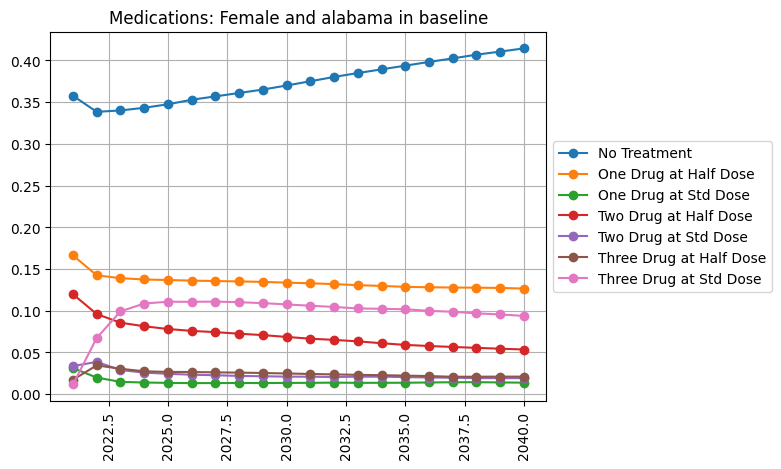

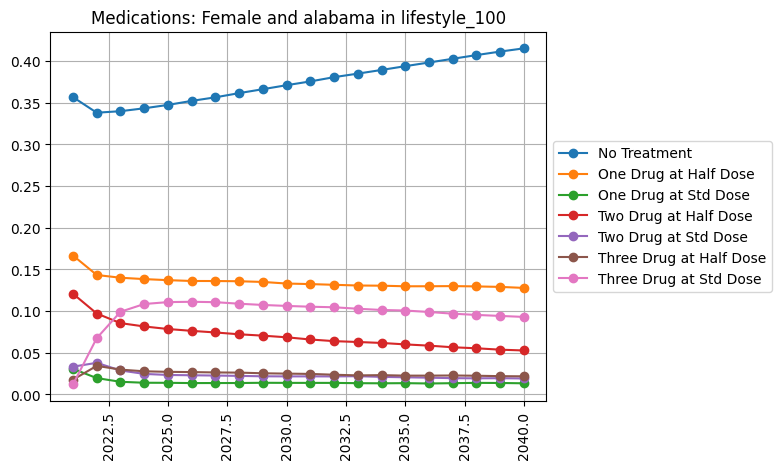

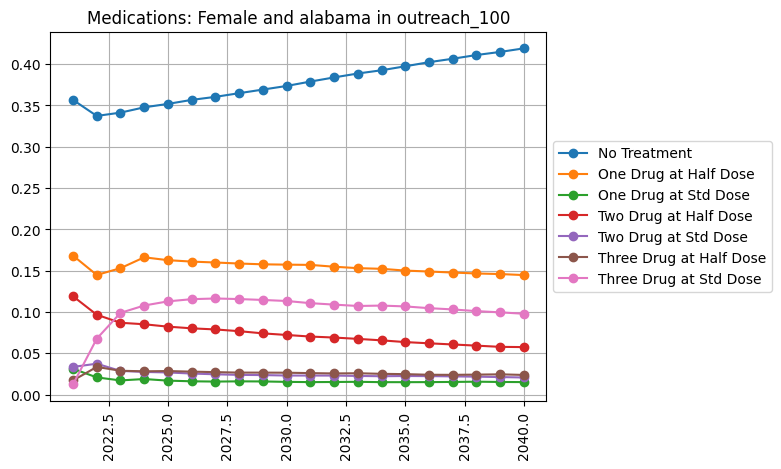

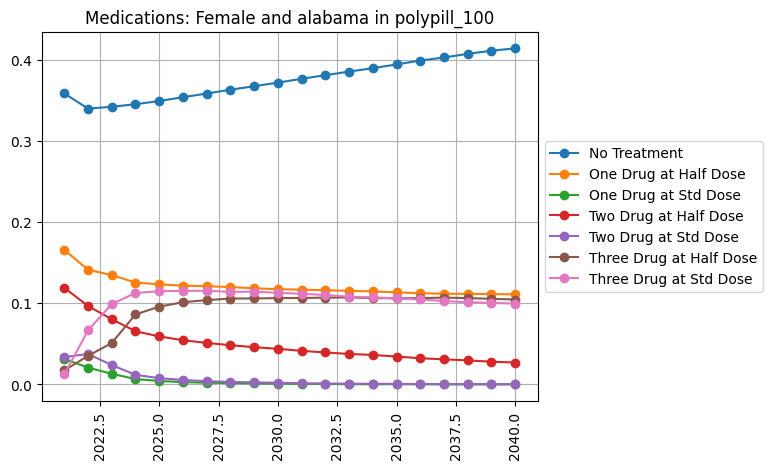

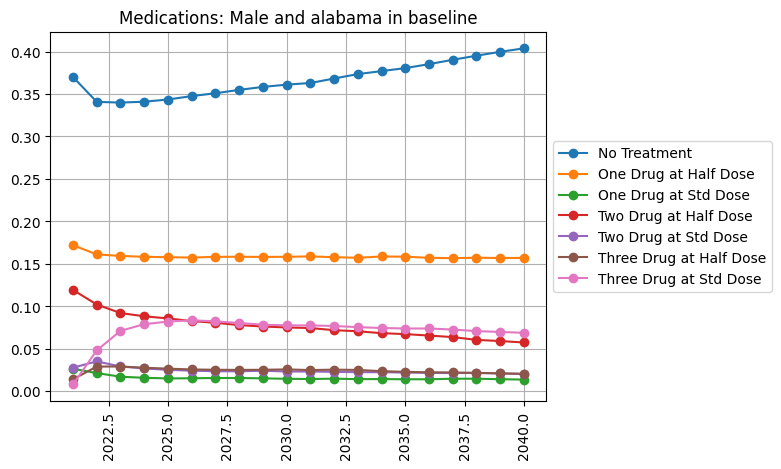

...

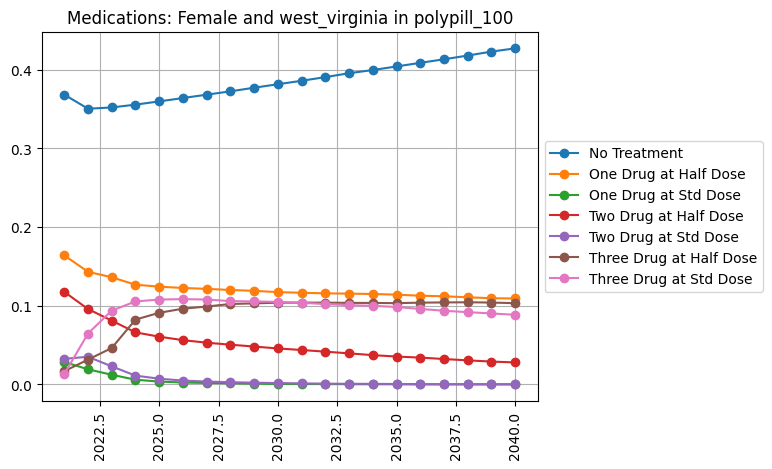

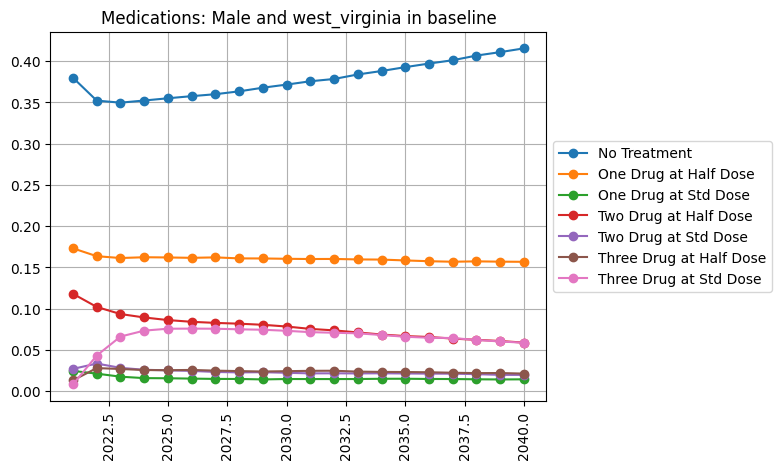

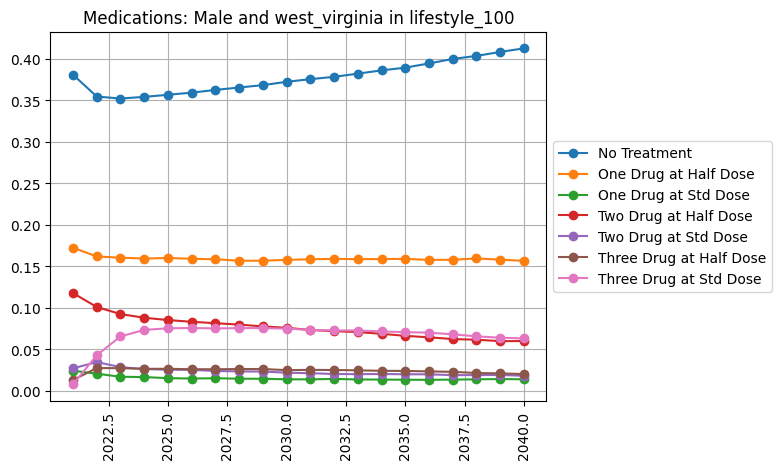

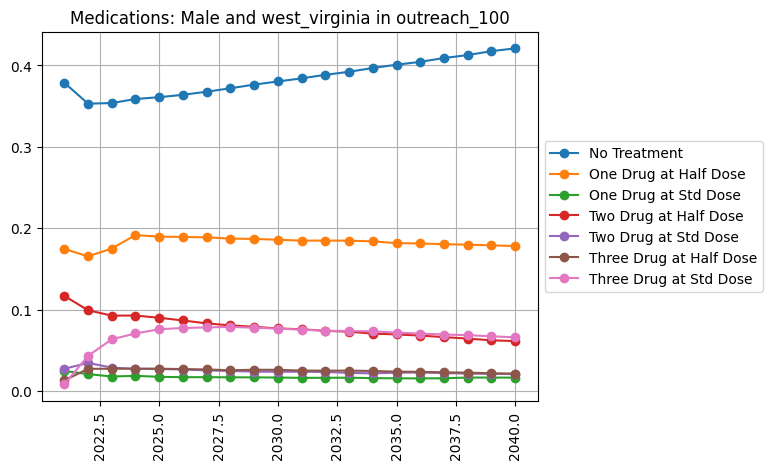

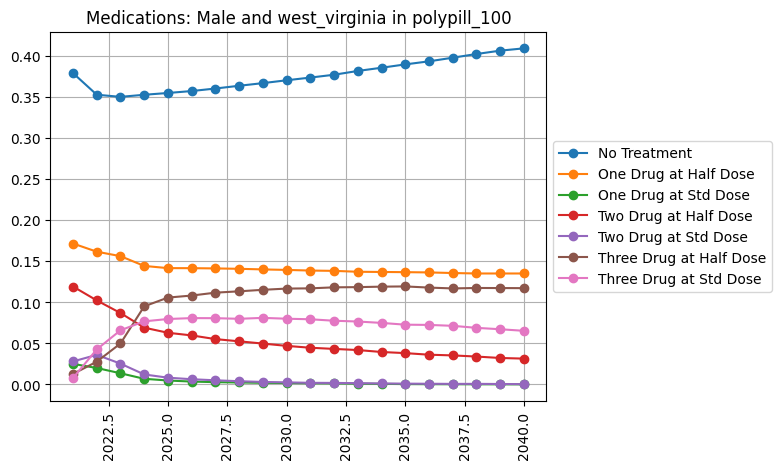

In [36]:
#%%capture
for location in meds_adherent_rate_summ.location.unique():
    for sex in meds_adherent_rate_summ.sex.unique():
        for scenario in meds_adherent_rate_summ.scenario.unique(): 
            plt.figure() 
            no_trt = meds_adherent_rate_summ.loc[(meds_adherent_rate_summ.location==location) & (meds_adherent_rate_summ.sex==sex) & (meds_adherent_rate_summ.scenario==scenario) & (meds_adherent_rate_summ.sbp_medication=='no_treatment')]
            plt.plot(no_trt['year'], no_trt['mean'], marker='o')
            #plt.fill_between(no_trt['year'], no_trt['2.5%'], no_trt['97.5%'], alpha=.3)
            one_half = meds_adherent_rate_summ.loc[(meds_adherent_rate_summ.location==location) & (meds_adherent_rate_summ.sex==sex) & (meds_adherent_rate_summ.scenario==scenario) & (meds_adherent_rate_summ.sbp_medication=='one_drug_half_dose_efficacy')]
            plt.plot(one_half['year'], one_half['mean'], marker='o')
            #plt.fill_between(one_half['year'], one_half['2.5%'], one_half['97.5%'], alpha=.3)
            one_std = meds_adherent_rate_summ.loc[(meds_adherent_rate_summ.location==location) & (meds_adherent_rate_summ.sex==sex) & (meds_adherent_rate_summ.scenario==scenario) & (meds_adherent_rate_summ.sbp_medication=='one_drug_std_dose_efficacy')]
            plt.plot(one_std['year'], one_std['mean'], marker='o')
            #plt.fill_between(one_std['year'], one_std['2.5%'], one_std['97.5%'], alpha=.3)
            two_half = meds_adherent_rate_summ.loc[(meds_adherent_rate_summ.location==location) & (meds_adherent_rate_summ.sex==sex) & (meds_adherent_rate_summ.scenario==scenario) & (meds_adherent_rate_summ.sbp_medication=='two_drug_half_dose_efficacy')]
            plt.plot(two_half['year'], two_half['mean'], marker='o')
            #plt.fill_between(two_half['year'], two_half['2.5%'], two_half['97.5%'], alpha=.3)
            two_std = meds_adherent_rate_summ.loc[(meds_adherent_rate_summ.location==location) & (meds_adherent_rate_summ.sex==sex) & (meds_adherent_rate_summ.scenario==scenario) & (meds_adherent_rate_summ.sbp_medication=='two_drug_std_dose_efficacy')]
            plt.plot(two_std['year'], two_std['mean'], marker='o')
            #plt.fill_between(two_std['year'], two_std['2.5%'], two_std['97.5%'], alpha=.3)
            three_half = meds_adherent_rate_summ.loc[(meds_adherent_rate_summ.location==location) & (meds_adherent_rate_summ.sex==sex) & (meds_adherent_rate_summ.scenario==scenario) & (meds_adherent_rate_summ.sbp_medication=='three_drug_half_dose_efficacy')]
            plt.plot(three_half['year'], three_half['mean'], marker='o')
            #plt.fill_between(three_half['year'], three_half['2.5%'], three_half['97.5%'], alpha=.3)
            three_std = meds_adherent_rate_summ.loc[(meds_adherent_rate_summ.location==location) & (meds_adherent_rate_summ.sex==sex) & (meds_adherent_rate_summ.scenario==scenario) & (meds_adherent_rate_summ.sbp_medication=='three_drug_std_dose_efficacy')]
            plt.plot(three_std['year'], three_std['mean'], marker='o')
            #plt.fill_between(three_std['year'], three_std['2.5%'], three_std['97.5%'], alpha=.3)
            plt.title(f'Medications: {sex} and {location} in {scenario}') 
            plt.xticks(rotation=90)
            plt.legend(['No Treatment', 'One Drug at Half Dose','One Drug at Std Dose','Two Drug at Half Dose','Two Drug at Std Dose','Three Drug at Half Dose','Three Drug at Std Dose'],loc='center left', bbox_to_anchor=(1, 0.5))
            plt.grid()

In [ ]:
ldl_meds = pd.read_csv(sim_results_dir + '/ldlc_medication_person_time.csv')
ldl_meds.head()

In [ ]:
meds_adherent = ldl_meds.loc[ldl_meds['medication_adherence']=='adherent'].reset_index()
meds_adherent_rate = meds_adherent.merge(per_time_group[['ptvalue','sex','age','year','input_draw','scenario','location']], on=['sex','age','year','input_draw','scenario','location'])
meds_adherent_rate['meds_adherent_rate'] = meds_adherent_rate['value'] / meds_adherent_rate['ptvalue']
meds_adherent_rate_summ = (meds_adherent_rate
                .groupby(['sex', 'year', 'ldlc_medication','scenario','location'])
                .meds_adherent_rate.describe(percentiles=[.025, .975])
                .filter(['mean', '2.5%', '97.5%'])
                .reset_index())
meds_adherent_rate_summ

In [ ]:
#%%capture
for location in meds_adherent_rate_summ.location.unique():
    for sex in meds_adherent_rate_summ.sex.unique():
        for scenario in meds_adherent_rate_summ.scenario.unique():
            plt.figure() 
            no_trt = meds_adherent_rate_summ.loc[(meds_adherent_rate_summ.location==location) & (meds_adherent_rate_summ.sex==sex) & (meds_adherent_rate_summ.scenario==scenario) & (meds_adherent_rate_summ.ldlc_medication=='no_treatment')]
            plt.plot(no_trt['year'], no_trt['mean'], marker='o')
            #plt.fill_between(no_trt['year'], no_trt['2.5%'], no_trt['97.5%'], alpha=.3)
            one_half = meds_adherent_rate_summ.loc[(meds_adherent_rate_summ.location==location) & (meds_adherent_rate_summ.sex==sex) & (meds_adherent_rate_summ.scenario==scenario) & (meds_adherent_rate_summ.ldlc_medication=='low_intensity')]
            plt.plot(one_half['year'], one_half['mean'], marker='o')
            #plt.fill_between(one_half['year'], one_half['2.5%'], one_half['97.5%'], alpha=.3)
            one_std = meds_adherent_rate_summ.loc[(meds_adherent_rate_summ.location==location) & (meds_adherent_rate_summ.sex==sex) & (meds_adherent_rate_summ.scenario==scenario) & (meds_adherent_rate_summ.ldlc_medication=='medium_intensity')]
            plt.plot(one_std['year'], one_std['mean'], marker='o')
            #plt.fill_between(one_std['year'], one_std['2.5%'], one_std['97.5%'], alpha=.3)
            two_half = meds_adherent_rate_summ.loc[(meds_adherent_rate_summ.location==location) & (meds_adherent_rate_summ.sex==sex) & (meds_adherent_rate_summ.scenario==scenario) & (meds_adherent_rate_summ.ldlc_medication=='high_intensity')]
            plt.plot(two_half['year'], two_half['mean'], marker='o')
            #plt.fill_between(two_half['year'], two_half['2.5%'], two_half['97.5%'], alpha=.3)
            two_std = meds_adherent_rate_summ.loc[(meds_adherent_rate_summ.location==location) & (meds_adherent_rate_summ.sex==sex) & (meds_adherent_rate_summ.scenario==scenario) & (meds_adherent_rate_summ.ldlc_medication=='low_med_with_eze')]
            plt.plot(two_std['year'], two_std['mean'], marker='o')
            #plt.fill_between(two_std['year'], two_std['2.5%'], two_std['97.5%'], alpha=.3)
            three_half = meds_adherent_rate_summ.loc[(meds_adherent_rate_summ.location==location) & (meds_adherent_rate_summ.sex==sex) & (meds_adherent_rate_summ.scenario==scenario) & (meds_adherent_rate_summ.ldlc_medication=='high_with_eze')]
            plt.plot(three_half['year'], three_half['mean'], marker='o')
            #plt.fill_between(three_half['year'], three_half['2.5%'], three_half['97.5%'], alpha=.3)
            plt.title(f'Medications: {sex} and {location} in {scenario}') 
            plt.xticks(rotation=90)
            plt.legend(['No Treatment','Low Intensity','Medium Intensity','High Intensity','Low/Med Intensity with Eze','High Intensity with Eze'],loc='center left', bbox_to_anchor=(1, 0.5))
            plt.grid()

The outreach looks funny - the no treatment group increases? Need to investigate further 

## Time in Interventions 

In [42]:
intervention = pd.read_csv(sim_results_dir + '/intervention_person_time.csv')
print(intervention.intervention_type.unique())
print(intervention.scenario.unique())

['outreach' 'polypill']
['baseline' 'lifestyle_100' 'lifestyle_50' 'outreach_100' 'outreach_50'
 'polypill_100' 'polypill_50']


In [43]:
outreach = intervention.loc[(intervention.intervention == 'yes') & (intervention.intervention_type == 'outreach')]
outreach = (outreach
                .groupby(['age', 'sex', 'year','scenario','location'])
                .value.describe(percentiles=[.025, .975])
                .filter(['mean', '2.5%', '97.5%'])
                .reset_index())

outreach.head()

,age,sex,year,scenario,mean,2.5%,97.5%
0,25_to_29,female,2023,baseline,0.000000,0.000000,0.000000
1,25_to_29,female,2023,lifestyle_100,0.000000,0.000000,0.000000
2,25_to_29,female,2023,lifestyle_50,0.000000,0.000000,0.000000
3,25_to_29,female,2023,outreach_100,1143.680219,974.033949,1335.783984
4,25_to_29,female,2023,outreach_50,572.395893,485.243258,667.567146


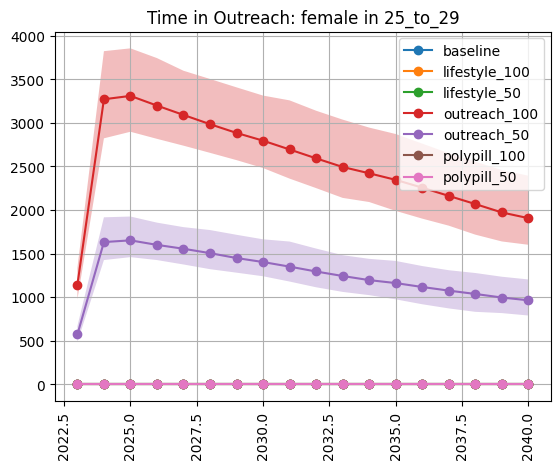

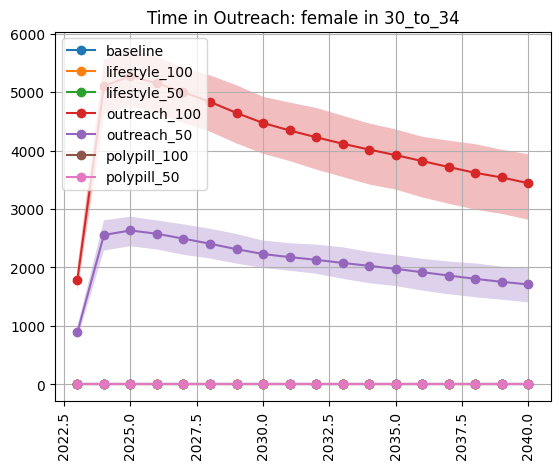

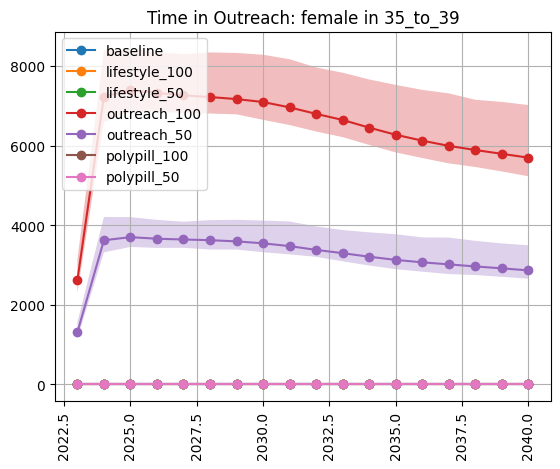

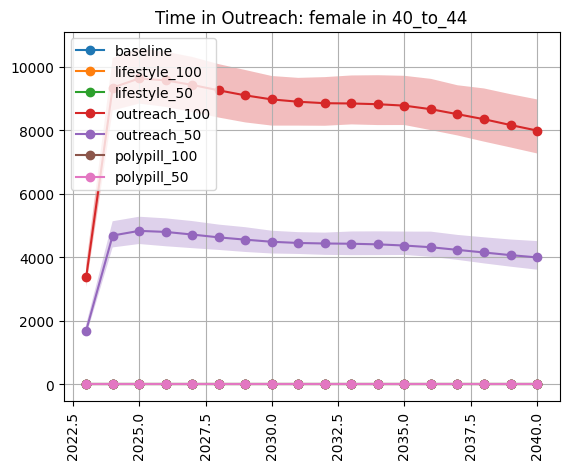

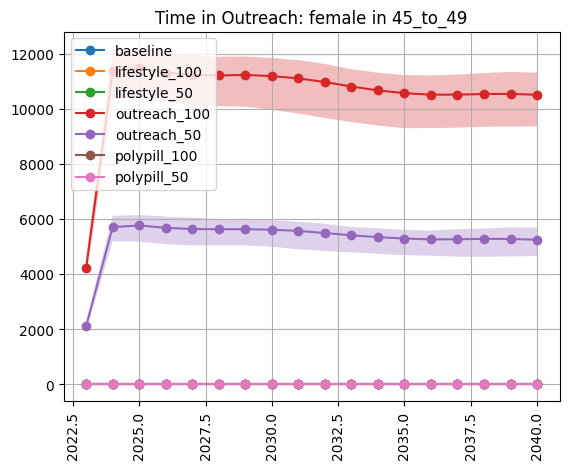

...

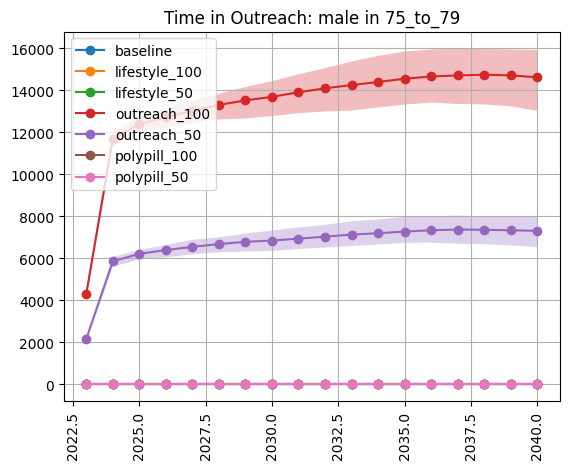

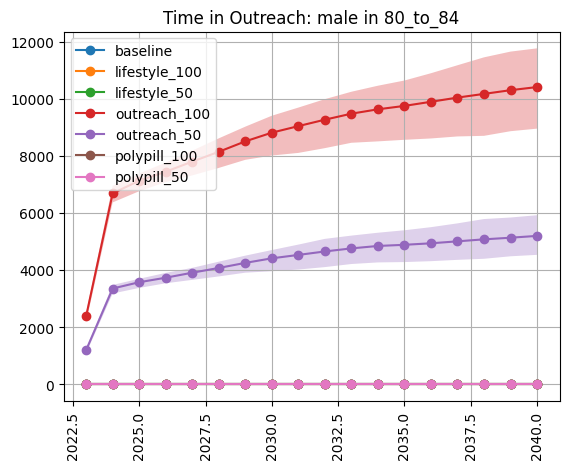

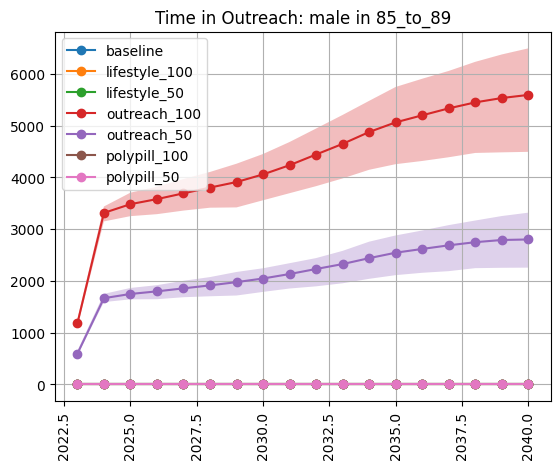

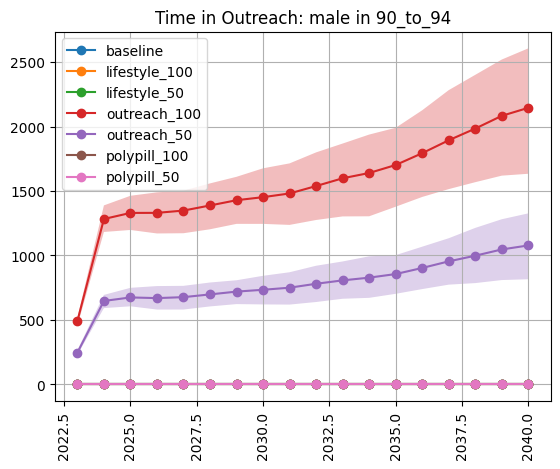

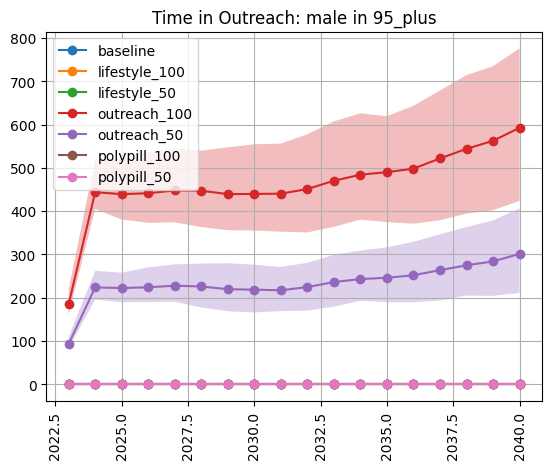

In [44]:
for location in outreach.location.unique():
    for sex in outreach.sex.unique():
        for age in outreach.age.unique():
            plt.figure() 
            subdata = outreach.loc[(outreach.location==location) & (outreach.sex==sex) & (outreach.age==age)]
            groups = subdata.groupby('scenario')
            for name, group in groups: 
                plt.plot(group['year'], group['mean'], marker='o', label=name)
                plt.fill_between(group['year'], group['2.5%'], group['97.5%'], alpha=.3)
            plt.legend()
            plt.title(f'Time in Outreach: {sex} and {location} in {age}') 
            plt.xticks(rotation=90) 
            plt.grid()

In [45]:
polypill = intervention.loc[(intervention.intervention == 'yes') & (intervention.intervention_type == 'polypill')]
polypill = (polypill
                .groupby(['age', 'sex', 'year','scenario','location'])
                .value.describe(percentiles=[.025, .975])
                .filter(['mean', '2.5%', '97.5%'])
                .reset_index())

polypill.head()

,age,sex,year,scenario,mean,2.5%,97.5%
0,25_to_29,female,2023,baseline,0.0,0.0,0.0
1,25_to_29,female,2023,lifestyle_100,0.0,0.0,0.0
2,25_to_29,female,2023,lifestyle_50,0.0,0.0,0.0
3,25_to_29,female,2023,outreach_100,0.0,0.0,0.0
4,25_to_29,female,2023,outreach_50,0.0,0.0,0.0


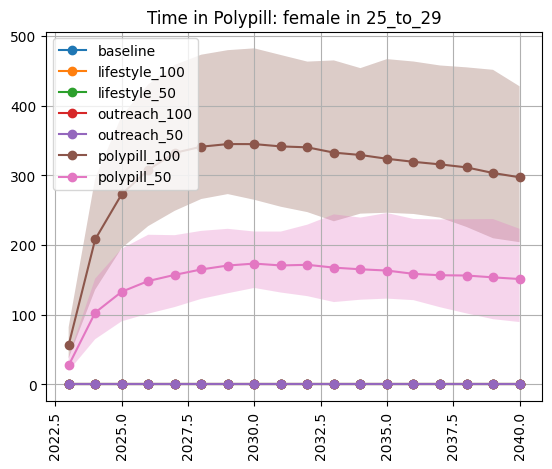

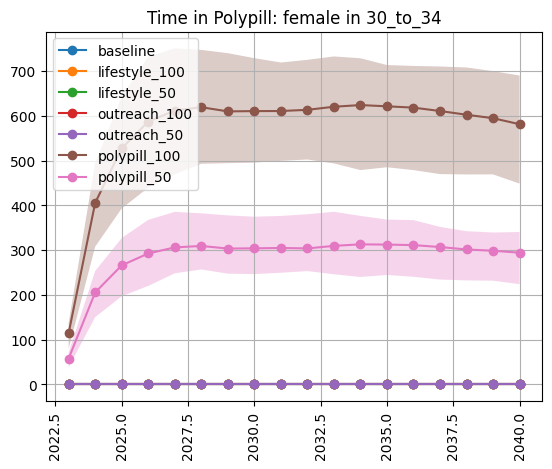

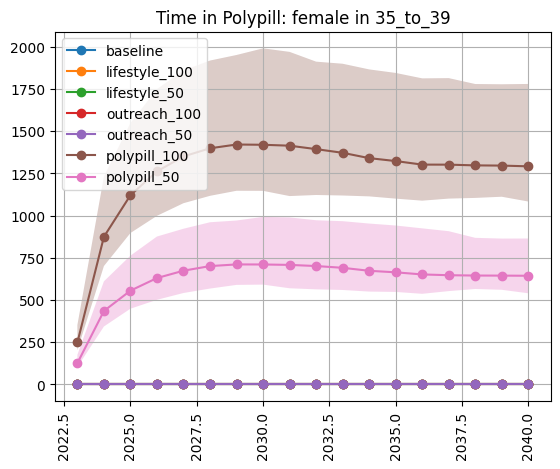

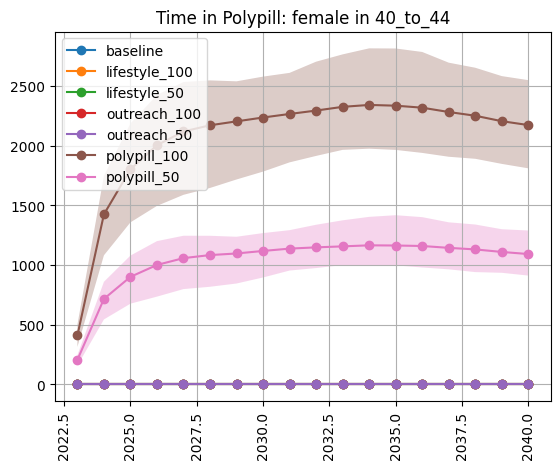

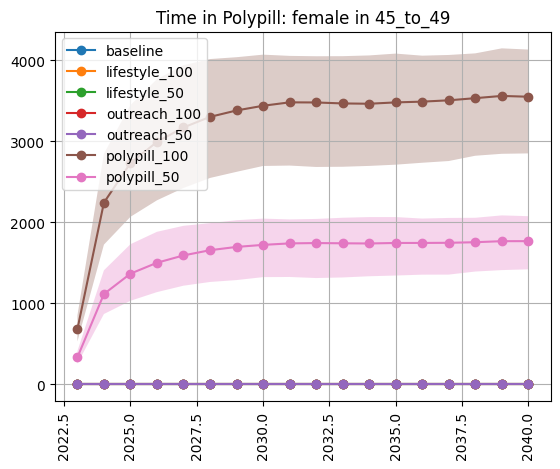

...

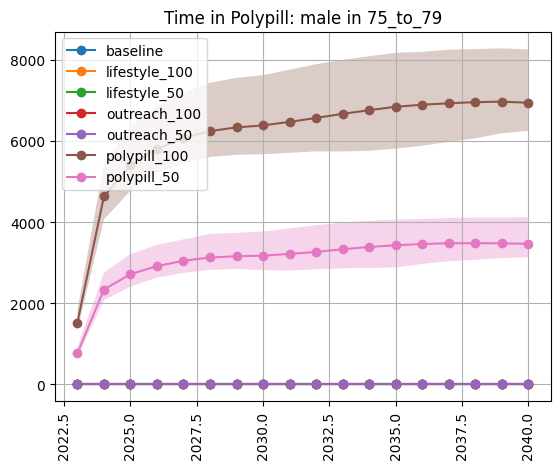

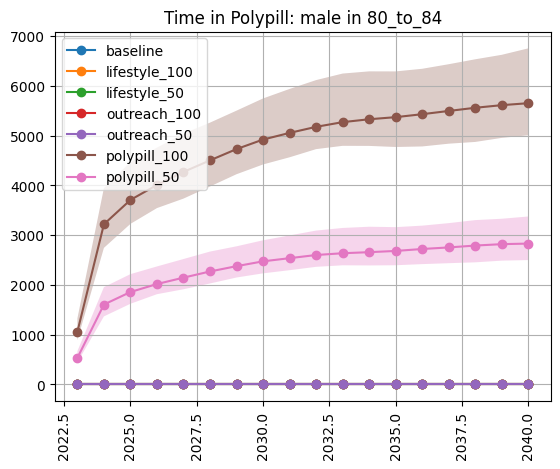

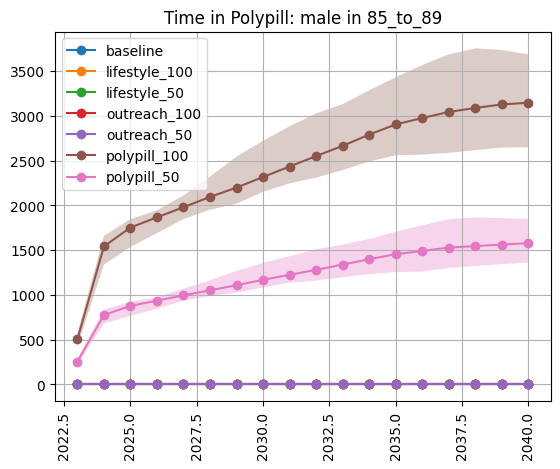

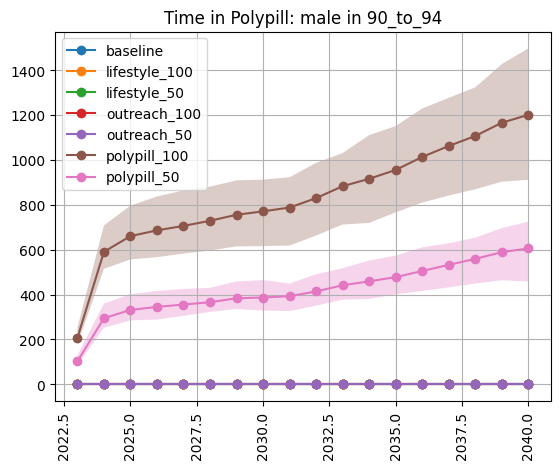

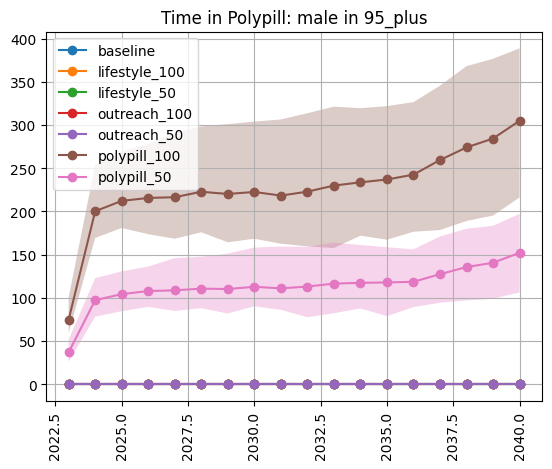

In [46]:
for location in polypill.location.unique():
    for sex in polypill.sex.unique():
        for age in polypill.age.unique():
            plt.figure() 
            subdata = polypill.loc[(polypill.location==location) & (polypill.sex==sex) & (polypill.age==age)]
            groups = subdata.groupby('scenario')
            for name, group in groups: 
                plt.plot(group['year'], group['mean'], marker='o', label=name)
                plt.fill_between(group['year'], group['2.5%'], group['97.5%'], alpha=.3)
            plt.legend()
            plt.title(f'Time in Polypill: {sex} and {location} in {age}') 
            plt.xticks(rotation=90) 
            plt.grid()
            pdf.savefig(bbox_inches='tight')

In [47]:
intervention.intervention_type.unique()

array(['outreach', 'polypill'], dtype=object)

In [48]:
lifestyle = intervention.loc[(intervention.intervention == 'yes') & (intervention.intervention_type == 'lifestyle')]
lifestyle = (lifestyle
                .groupby(['age', 'sex', 'year','scenario'])
                .value.describe(percentiles=[.025, .975])
                .filter(['mean', '2.5%', '97.5%'])
                .reset_index())

lifestyle.head()

,index,mean,2.5%,97.5%


In [49]:
with PdfPages('lifestyle_time_model13.pdf') as pdf:
    for sex in lifestyle.sex.unique():
        for age in lifestyle.age.unique():
            plt.figure() 
            subdata = lifestyle.loc[(lifestyle.sex==sex) & (lifestyle.age==age)]
            groups = subdata.groupby('scenario')
            for name, group in groups: 
                plt.plot(group['year'], group['mean'], marker='o', label=name)
                plt.fill_between(group['year'], group['2.5%'], group['97.5%'], alpha=.3)
            plt.legend()
            plt.title(f'Time in Lifestyle: {sex} in {age}') 
            plt.xticks(rotation=90) 
            plt.grid()
            pdf.savefig(bbox_inches='tight')

AttributeError: 'DataFrame' object has no attribute 'sex'

## Healthcare Visits 

In [ ]:
visits = pd.read_csv(sim_results_dir + '/healthcare_visits.csv')
visits.head()

In [ ]:
screening_art = load_artifact_data('healthcare_entity', 'outpatient_visits', 'outpatient_envelope')
screening_art['age_group'] = [f'{int(i)}_to_{int(j) - 1}' for (i,j) in zip(screening_art.age_start,screening_art.age_end)]
screening_art.head()

In [ ]:
screen = visits.loc[visits['visit_type']=='background'].reset_index()
screen_rate = screen.merge(per_time_group[['ptvalue','sex','age','year','input_draw','scenario']], on=['sex','age','year','input_draw','scenario'])
screen_rate['screen_rate'] = screen_rate['value'] / screen_rate['ptvalue']
screen_rate_summ = (screen_rate
                .groupby(['age', 'sex', 'year','scenario'])
                .screen_rate.describe(percentiles=[.025, .975])
                .filter(['mean', '2.5%', '97.5%'])
                .reset_index())
screen_rate_summ.head()

In [ ]:
#%%capture
for sex in screen_rate_summ.sex.unique():
    for age in screen_rate_summ.age.unique():
        plt.figure() 
        subdata = screen_rate_summ.loc[(screen_rate_summ.sex==sex) & (screen_rate_summ.age==age)&(screen_rate_summ.scenario=='baseline')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        subdata = screen_rate_summ.loc[(screen_rate_summ.sex==sex) & (screen_rate_summ.age==age)&(screen_rate_summ.scenario=='lifestyle_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        subdata = screen_rate_summ.loc[(screen_rate_summ.sex==sex) & (screen_rate_summ.age==age)&(screen_rate_summ.scenario=='outreach_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        subdata = screen_rate_summ.loc[(screen_rate_summ.sex==sex) & (screen_rate_summ.age==age)&(screen_rate_summ.scenario=='polypill_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.legend(['Baseline','Lifestyle','Outreach','Polypill'])
        plt.title(f'Screening Visits: {sex} in {age}') 
        plt.xticks(rotation=90) 
        plt.grid()

In [ ]:
for sex in screen_rate_summ.sex.unique():
    plt.figure() 
    subdata = screen_rate_summ.loc[(screen_rate_summ.sex==sex) & (screen_rate_summ.year==2023) & (screen_rate_summ.scenario=='baseline')]
    plt.plot(subdata['age'], subdata['mean'], marker='o')
    plt.fill_between(subdata['age'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
    subdata2 = screening_art.loc[(screening_art.sex==sex)]
    plt.plot(subdata2['age_group'], subdata2['mean'], marker='o')
    plt.fill_between(subdata2['age_group'], subdata2['2.5%'], subdata2['97.5%'], alpha=.3)
    plt.title(f'Screening Visits in 2023: {sex}') 
    plt.xticks(rotation=90) 
    plt.legend(['Simulation baseline', 'Sim 95%', 'Artifact Baseline', 'Artifact 95%'])     
    plt.grid()

In [ ]:
for sex in screen_rate_summ.sex.unique():
    plt.figure() 
    subdata = screen_rate_summ.loc[(screen_rate_summ.sex==sex) & (screen_rate_summ.year==2040) & (screen_rate_summ.scenario=='baseline')]
    plt.plot(subdata['age'], subdata['mean'], marker='o')
    plt.fill_between(subdata['age'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
    subdata2 = screening_art.loc[(screening_art.sex==sex)]
    plt.plot(subdata2['age_group'], subdata2['mean'], marker='o')
    plt.fill_between(subdata2['age_group'], subdata2['2.5%'], subdata2['97.5%'], alpha=.3)
    plt.title(f'Screening Visits in 2040: {sex}') 
    plt.xticks(rotation=90) 
    plt.legend(['Simulation baseline', 'Sim 95%', 'Artifact Baseline', 'Artifact 95%'])     
    plt.grid()

In [ ]:
followup = visits.loc[visits['visit_type']=='scheduled'].reset_index()
followup_rate = followup.merge(per_time_group[['ptvalue','sex','age','year','input_draw','scenario']], on=['sex','age','year','input_draw','scenario'])
followup_rate['followup_rate'] = followup_rate['value'] / followup_rate['ptvalue']
followup_rate_summ = (followup_rate
                .groupby(['age', 'sex', 'year','scenario'])
                .followup_rate.describe(percentiles=[.025, .975])
                .filter(['mean', '2.5%', '97.5%'])
                .reset_index())
followup_rate_summ

In [ ]:
#%%capture
for sex in followup_rate_summ.sex.unique():
    for age in followup_rate_summ.age.unique():
        plt.figure() 
        subdata = followup_rate_summ.loc[(followup_rate_summ.sex==sex) & (followup_rate_summ.age==age) & (followup_rate_summ.scenario=='baseline')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        subdata = followup_rate_summ.loc[(followup_rate_summ.sex==sex) & (followup_rate_summ.age==age) & (followup_rate_summ.scenario=='lifestyle_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        subdata = followup_rate_summ.loc[(followup_rate_summ.sex==sex) & (followup_rate_summ.age==age) & (followup_rate_summ.scenario=='outreach_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        subdata = followup_rate_summ.loc[(followup_rate_summ.sex==sex) & (followup_rate_summ.age==age) & (followup_rate_summ.scenario=='polypill_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.legend(['Baseline','Lifestyle','Outreach','Polypill'])
        plt.title(f'Follow-up Visits: {sex} in {age}') 
        plt.xticks(rotation=90) 
        plt.grid()

In [ ]:
screen_follow = screen_rate.merge(followup_rate[['followup_rate','sex','age','year','input_draw','scenario']], on=['sex','age','year','input_draw','scenario'])
screen_follow['screen_follow'] = screen_follow['screen_rate'] + screen_follow['followup_rate']
screen_follow_summ = (screen_follow
                .groupby(['age', 'sex', 'year','scenario'])
                .screen_follow.describe(percentiles=[.025, .975])
                .filter(['mean', '2.5%', '97.5%'])
                .reset_index())

screen_follow_summ.head()

In [ ]:
for sex in screen_follow_summ.sex.unique():
    for age in screen_follow_summ.age.unique():
        plt.figure() 
        subdata = screen_follow_summ.loc[(screen_follow_summ.sex==sex) & (screen_follow_summ.age==age) & (screen_follow_summ.scenario=='baseline')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        subdata = screen_follow_summ.loc[(screen_follow_summ.sex==sex) & (screen_follow_summ.age==age) & (screen_follow_summ.scenario=='lifestyle_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        subdata = screen_follow_summ.loc[(screen_follow_summ.sex==sex) & (screen_follow_summ.age==age) & (screen_follow_summ.scenario=='outreach_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        subdata = screen_follow_summ.loc[(screen_follow_summ.sex==sex) & (screen_follow_summ.age==age) & (screen_follow_summ.scenario=='polypill_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.legend(['Baseline','Lifestyle','Outreach','Polypill'])
        plt.title(f'Screening and Follow-up Visits: {sex} in {age}') 
        plt.xticks(rotation=90) 
        plt.grid()